In [132]:
from langchain_openai import ChatOpenAI
import os
from dotenv import load_dotenv

# Load API Key
load_dotenv()
api_key = os.getenv("OPENAI_API_KEY")

# Initialize the language model
llm = ChatOpenAI(openai_api_key=api_key, max_tokens=100, temperature=0.7)

In [133]:
from langchain_core.prompts import ChatPromptTemplate

prompt = ChatPromptTemplate.from_messages([
    ("system", "You are a CPTSD Therapist with 20 plus years experience in healing people from CPTSD."),
    ("user", "{input}"),
    
])

chain = prompt | llm


In [134]:
from langchain_core.output_parsers import StrOutputParser

output_parser = StrOutputParser()
chain = chain | output_parser


In [135]:
import pdfplumber

# Function to read and update the current page number
def get_and_update_current_page(file_path, increment=2):
    try:
        with open(file_path, 'r') as file:
            current_page = int(file.read().strip())
    except FileNotFoundError:
        current_page = 0  # Default starting page if file not found

    new_current_page = current_page + increment

    with open(file_path, 'w') as file:
        file.write(str(new_current_page))

    return current_page, new_current_page

# Function to extract text from a specific section of the PDF
def extract_section_from_pdf(pdf_path, start_page, end_page):
    text = ""
    with pdfplumber.open(pdf_path) as pdf:
        pages = pdf.pages[start_page:end_page]
        for page in pages:
            text += page.extract_text() + "\n"
    return text

# File to store current page number
current_page_file = 'current_page.txt'

# Get the current page and update it for the next run
start_page, next_start_page = get_and_update_current_page(current_page_file)


# Extract text from today's section
pdf_text = extract_section_from_pdf("CPTSD.pdf", start_page, next_start_page)

# Invoke the chain with your query
response = chain.invoke({"input": "write a 20 words inspirational quote for a person suffering from cptsd that would heal them, from the following text" + pdf_text})

# Print the response
print(response)
#print(pdf_text)

"Embrace the full spectrum of your emotions, for they hold the key to your healing and liberation from CPTSD."


In [137]:
from langchain.chains import LLMChain
from langchain.prompts import PromptTemplate
from langchain_community.utilities.dalle_image_generator import DallEAPIWrapper
from langchain_openai import OpenAI

llm = OpenAI(temperature=0.9)

# Define the prompt template
prompt_template = PromptTemplate(
    input_variables=[""],
    template=" {image_desc}",
)

# Create a chain with the LLM and the prompt template
chain = LLMChain(llm=llm, prompt=prompt_template)

# Your quote
quote = response

# Description for the image
description = f"Create an inspiring, hopeful, and positive image without including any text in the image: {quote}"

# Generate the image URL using DallEAPIWrapper with the prompt created by the chain
image_url = DallEAPIWrapper().run(chain.run({"image_desc": description}))

# Display or process the image URL
print(image_url)

https://oaidalleapiprodscus.blob.core.windows.net/private/org-zm1WcqAOsYMhiQUDxYr1e9Nt/user-mI8qBylLmShwDRG0mowekWJi/img-6rl65OmJP4674ADqiDooQK0z.png?st=2024-01-27T09%3A31%3A16Z&se=2024-01-27T11%3A31%3A16Z&sp=r&sv=2021-08-06&sr=b&rscd=inline&rsct=image/png&skoid=6aaadede-4fb3-4698-a8f6-684d7786b067&sktid=a48cca56-e6da-484e-a814-9c849652bcb3&skt=2024-01-27T06%3A03%3A53Z&ske=2024-01-28T06%3A03%3A53Z&sks=b&skv=2021-08-06&sig=UFWpa5K1H7IGpaoN3/BSVrt6lU4gfXVVUJCb7Sejvm0%3D


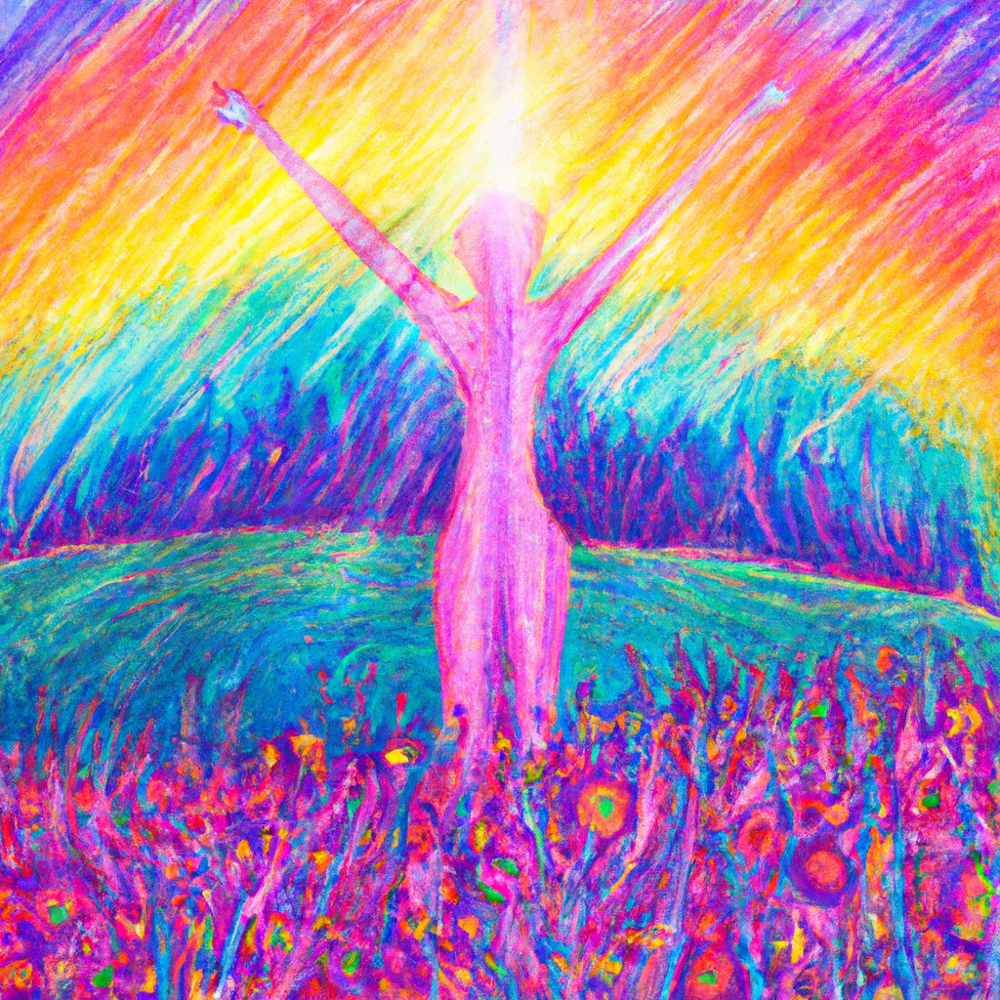

In [141]:
import requests
from PIL import Image
from io import BytesIO
from IPython.display import display
import datetime


response = requests.get(image_url)
image_data = BytesIO(response.content)
image = Image.open(image_data)

display(image)

# Generate a unique filename with the current date and time
current_time = datetime.datetime.now().strftime("%Y%m%d_%H%M%S")
filename = f"image_{current_time}.jpg"  # The file will be saved with a .jpg extension

# Save the image in the current directory with the generated filename
image.save(filename)



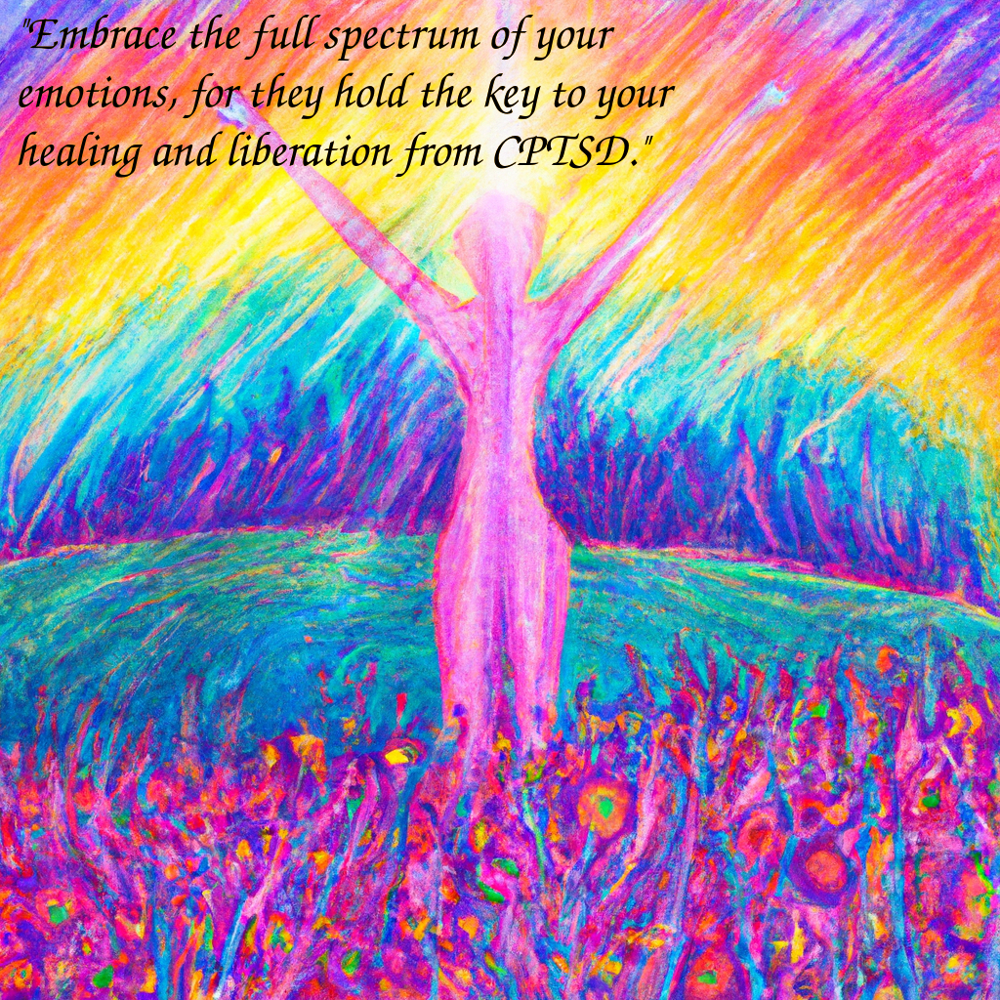

In [143]:
from PIL import Image, ImageDraw, ImageFont
import textwrap


def draw_multiline_text(image, text, position, font, text_color, line_spacing=1.2):
    draw = ImageDraw.Draw(image)
    lines = textwrap.wrap(text, width=40)  # Adjust 'width' as needed

    x, y = position
    line_height = int(font.size * line_spacing)  # Calculate line height based on font size and line spacing

    for line in lines:
        draw.text((x, y), line, font=font, fill=text_color)
        y += line_height  # Increment y position by line height


# Load the font
font_path = 'fonts/Z003-MediumItalic.otf'
mf = ImageFont.truetype(font_path, 50)


# Use the function
draw_multiline_text(image, quote, (15, 15), mf, (0, 0, 0))

# Display the image
display(image)

# Optionally, save the image
# image.save('output_with_text.png')
# Generate a unique filename with the current date and time




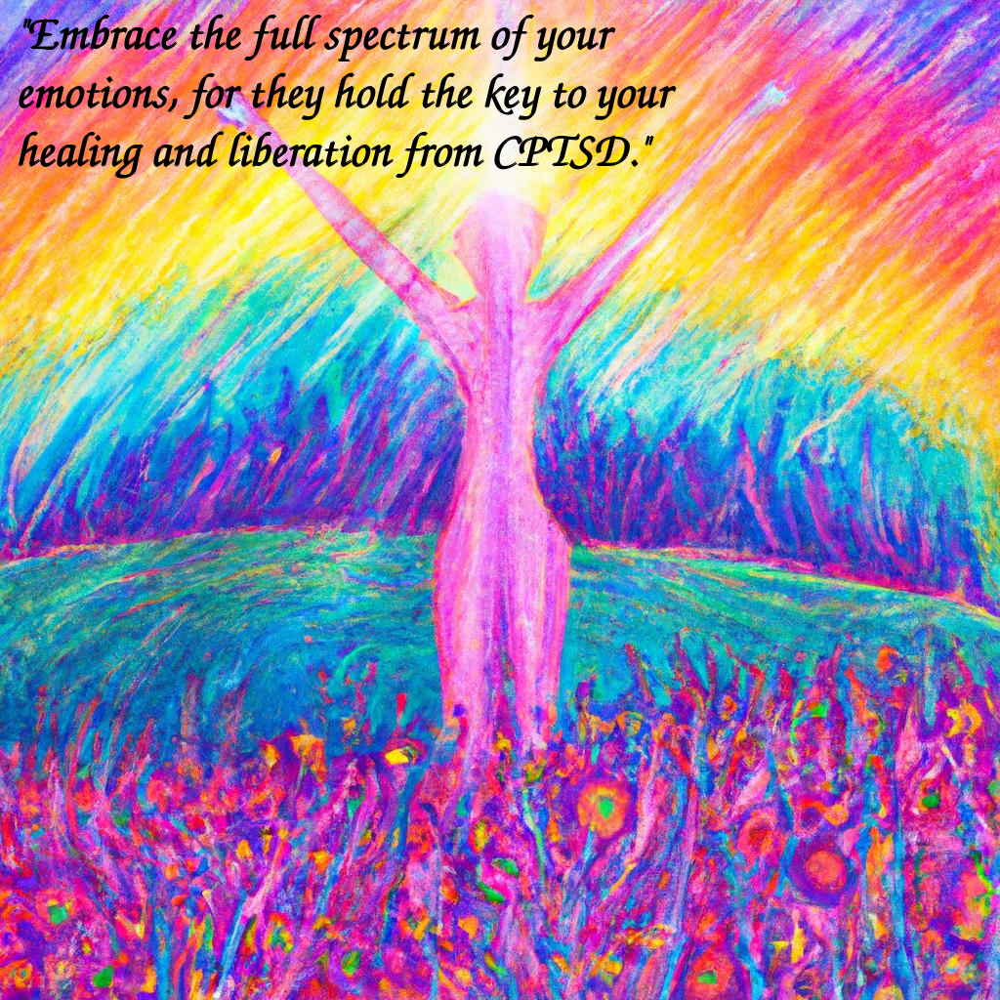

In [151]:
from PIL import Image, ImageDraw, ImageFont
import textwrap

image_path = '/home/agentx/Desktop/Social_media_project/image_20240127_214014.jpg'
image = Image.open(image_path)

def draw_multiline_text_with_shadow(image, text, position, font, text_color, shadow_color, shadow_offset, line_spacing=1.2):
    draw = ImageDraw.Draw(image)
    lines = textwrap.wrap(text, width=40)  # Adjust 'width' as needed

    x, y = position
    shadow_x, shadow_y = shadow_offset
    line_height = int(font.size * line_spacing)  # Calculate line height based on font size and line spacing

    for line in lines:
        # Draw shadow
        draw.text((x + shadow_x, y + shadow_y), line, font=font, fill=shadow_color)
        
        # Draw text
        draw.text((x, y), line, font=font, fill=text_color)
        y += line_height  # Increment y position by line height

# Load the font
font_path = 'fonts/Z003-MediumItalic.otf'
mf = ImageFont.truetype(font_path, 50)

# Shadow settings
shadow_color = "black"  # Gray shadow
shadow_offset = (1, 1)  # Offset for shadow

# Use the function with shadow
draw_multiline_text_with_shadow(image, quote, (15, 15), mf, 'black', shadow_color, shadow_offset)

# Display the image
display(image)
